## **HOW POWERFUL ARE GRAPH NEURAL NETWORKS?** 
<br>&emsp;Autori: Keyulu Xu,  Weihua Hu, Jure Leskovec, Stefanie Jegelka
<br>&emsp;**Ce își propune acest paper să realizeze?**
<br>&emsp;Acest paper prezintă aspectele teoretice pentru a analiza puterea expresivă a rețelelor neuronale pe grafuri (GNN). Autorii analizează capacitatea de reprezentare a diferitelor arhitecturi GNN în comparație cu altele, cum ar fi rețelele neuronale convoluționale (CNN).

In [1]:
import argparse
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from torch_geometric.datasets import TUDataset
from torch_geometric.utils import to_networkx
from tqdm import tqdm
from torch.optim import SGD
import random

from sklearn.model_selection import StratifiedKFold

criterion = nn.CrossEntropyLoss()

&emsp;În următoarea celulă este realizat MLP-ul care este alcătuit dintr-un input layer, unul sau mai multe hidden layers și un layer de output. De menționat este faptul că fiecare layer este fully connected adică, fiecare neuron dintr-un layer este conectat la toți neuronii din layer-ul următor. <br>
&emsp;Conform paper-ului, după fiecare hidden layer (toate layer-urile în afară de cel de ieșire) avem layere de activate; se aplică un Batch normalization și un ReLU.

In [2]:
class MLP(nn.Module):
    def __init__(self, num_layers, input_dim, hidden_dim, output_dim):
        super(MLP, self).__init__()

        self.linear_or_not = True                                        # by default e model liniar
        self.num_layers = num_layers

        if num_layers < 1:
            raise ValueError("number of layers should be positive!")
        elif num_layers == 1:                                            #Linear model- nu are hidden layer
            self.linear = nn.Linear(input_dim, output_dim)               #variabila linear are un singur layer liniar
        else:                                                            #Multi-layer model
            self.linear_or_not = False
            self.linears = torch.nn.ModuleList()       #variabila linears va reprezenta o lista de layere liniare
            self.batch_norms = torch.nn.ModuleList()   #la fel ca la linears, bathc_norms reprezinta o lista de batch_norms

            #se creează structura MLP, un input layer, hidden layers și output layer
            self.linears.append(nn.Linear(input_dim, hidden_dim))
            for layer in range(num_layers - 2):
                self.linears.append(nn.Linear(hidden_dim, hidden_dim))
            self.linears.append(nn.Linear(hidden_dim, output_dim))

            #se trece peste fiecare hidden layer al MLP-ului si se adauga un batch normalization layers
            for layer in range(num_layers - 1):
                self.batch_norms.append(nn.BatchNorm1d((hidden_dim)))

    def forward(self, x):
        if self.linear_or_not:                                    #daca este model liniar
            return self.linear(x)
        else:                                                     #cand avem MLP
            h = x                                                 # initial, reprezentarea grafului (h) este chiar feature map-ul (x)
            for layer in range(self.num_layers - 1):              #merge peste hidden layers
                h = F.relu(self.batch_norms[layer](self.linears[layer](h)))
            return self.linears[self.num_layers - 1](h)

Implementarea autorilor a rețelei dezvoltate, împreună cu alte funcții ajutătoare.

In [3]:
import sys
sys.path.append("models/")

class GIN(nn.Module):
    def __init__(self, num_layers, num_mlp_layers, input_dim, hidden_dim, output_dim, final_dropout, learn_eps, graph_pooling_type, neighbor_pooling_type, device):
        super(GIN, self).__init__()

        self.final_dropout = final_dropout
        self.device = device
        self.num_layers = num_layers
        self.graph_pooling_type = graph_pooling_type
        self.neighbor_pooling_type = neighbor_pooling_type
        self.learn_eps = learn_eps
        self.eps = nn.Parameter(torch.zeros(self.num_layers-1))

        self.mlps = torch.nn.ModuleList()           #lista de MLPs
        self.batch_norms = torch.nn.ModuleList()    #Lista de batchnorms care se aplica la iesirea din MLP

        for layer in range(self.num_layers-1):      #aici se construiesc MLP și Batch din GIN
            if layer == 0:
                self.mlps.append(MLP(num_mlp_layers, input_dim, hidden_dim, hidden_dim))
            else:
                self.mlps.append(MLP(num_mlp_layers, hidden_dim, hidden_dim, hidden_dim))
            self.batch_norms.append(nn.BatchNorm1d(hidden_dim)) 

        #Linear function that maps the hidden representation at differemt layers into a prediction score
        self.linears_prediction = torch.nn.ModuleList() #predictia de dupa fiecare strat al GCN-ului. Sunt LL care ies dupa ReLU
        for layer in range(num_layers):
            if layer == 0:
                self.linears_prediction.append(nn.Linear(input_dim, output_dim))
            else:
                self.linears_prediction.append(nn.Linear(hidden_dim, output_dim))


    def __preprocess_neighbors_maxpool(self, batch_graph):
        #se va creea o lista cu toti vecinii din toate grafurile
        max_deg = max([graph.max_neighbor for graph in batch_graph])        #nr maxim de vecini al unui nod din toate grafurile
        padded_neighbor_list = []
        start_idx = [0]                                                     #o lista care conține ”inceputul” fiecărui graf

        for i, graph in enumerate(batch_graph):                             #i-indexul graf curent, graph-graful în sine, grafurile concatenate
            start_idx.append(start_idx[i] + len(graph.g))                   #se adauga urmatorul index de start al urm graf 
            padded_neighbors = []
            for j in range(len(graph.neighbors)):
                pad = [n + start_idx[i] for n in graph.neighbors[j]]  #se va creea o listă cu toți vecinii nodului j (poziția lor este relativă față de ”începutul grafului”)
                pad.extend([-1]*(max_deg - len(pad)))                 #la lista se sus creeată se va adăuga elem -1 până când lista va avea aceeași dime cu nr maxim de vecini

                #Add center nodes in the maxpooling if learn_eps is False, i.e., aggregate center nodes and neighbor nodes altogether.
                if not self.learn_eps:
                    pad.append(j + start_idx[i])             #la final pad=[veicini, -1, ...-1, nod]     
                padded_neighbors.append(pad)                 #padded_neighbors va conține o listă cu toții vecinii dintr-un gra
            padded_neighbor_list.extend(padded_neighbors)    #padded_neighbors_list va conține o listă cu toți vecinii din toate grafurile
        return torch.LongTensor(padded_neighbor_list)


    def __preprocess_neighbors_sumavepool(self, batch_graph):
        ###create block diagonal sparse matrix
        edge_mat_list = []
        start_idx = [0]
        for i, graph in enumerate(batch_graph):                   #mergem din graf în graf
            start_idx.append(start_idx[i] + len(graph.g))         #indexul de start al următorului graf
            #se lipeste matricea coresp muchiilor la lista mare, se aduna start_idx pt a indica corect nodul în relație cu întregul graf
            edge_mat_list.append(graph.edge_mat + start_idx[i])
        Adj_block_idx = torch.cat(edge_mat_list, 1)               #se vor concatena pe X, adică una după alta, NU una sub alta
        Adj_block_elem = torch.ones(Adj_block_idx.shape[1])       #se va face o matrice de 1 care va avea dimensiunea lui Adj_block_idx

        #Add self-loops in the adjacency matrix if learn_eps is False, i.e., aggregate center nodes and neighbor nodes altogether.
        if not self.learn_eps:
            num_node = start_idx[-1]                                                   #numărul total de noduri dintr-un graf
            self_loop_edge = torch.LongTensor([range(num_node), range(num_node)])      #se creează arc circular
            elem = torch.ones(num_node)
            Adj_block_idx = torch.cat([Adj_block_idx, self_loop_edge], 1)
            Adj_block_elem = torch.cat([Adj_block_elem, elem], 0)

        Adj_block = torch.sparse_coo_tensor(Adj_block_idx, Adj_block_elem, torch.Size([start_idx[-1],start_idx[-1]]))
        return Adj_block.to(self.device)                                              #va returna matricea de adiacență cu self-loop


    def __preprocess_graphpool(self, batch_graph):
        #create sum or average pooling sparse matrix over entire nodes in each graph (num graphs x num nodes)
        start_idx = [0]                                             #listă cu noduirle de început al fiecărui graf
        for i, graph in enumerate(batch_graph):
            start_idx.append(start_idx[i] + len(graph.g))
        idx = []
        elem = []
        for i, graph in enumerate(batch_graph):
            if self.graph_pooling_type == "average":
                elem.extend([1./len(graph.g)]*len(graph.g))        #dacă graful are 3 noduri, elem se va extinde cu [0.33, 0.33, 0.33]
            else:
                elem.extend([1]*len(graph.g))                      #dacă graful are 5 noduri, elem se va extinde cu [1, 1, 1]
            idx.extend([[i, j] for j in range(start_idx[i], start_idx[i+1], 1)])    #idx se va extinde cu perechea [indexul grafului curent, nodul din graf]
        elem = torch.FloatTensor(elem)
        idx = torch.LongTensor(idx).transpose(0,1)
        graph_pool = torch.sparse_coo_tensor(idx, elem, torch.Size([len(batch_graph), start_idx[-1]]))  #va conține matricea de adiacență
        return graph_pool.to(self.device)                      
        

    def maxpool(self, h, padded_neighbor_list):
        #param : padded_neighbor_list-listă cu toate nodurile și cu toți vecinii
        ###Element-wise minimum will never affect max-pooling
        
        dummy = torch.min(h, dim = 0)[0]
        h_with_dummy = torch.cat([h, dummy.reshape((1, -1)).to(self.device)])
        pooled_rep = torch.max(h_with_dummy[padded_neighbor_list], dim = 1)[0]
        return pooled_rep


    def next_layer_eps(self, h, layer, padded_neighbor_list = None, Adj_block = None):
        ###pooling neighboring nodes and center nodes separately by epsilon reweighting. 
        if self.neighbor_pooling_type == "max":                   ##If max pooling
            pooled = self.maxpool(h, padded_neighbor_list)
        else:
            pooled = torch.spmm(Adj_block, h)
            if self.neighbor_pooling_type == "average":          #If average pooling
                degree = torch.spmm(Adj_block, torch.ones((Adj_block.shape[0], 1)).to(self.device))
                pooled = pooled/degree
        #Reweights the center node representation when aggregating it with its neighbors
        pooled = pooled + (1 + self.eps[layer])*h
        pooled_rep = self.mlps[layer](pooled)
        h = self.batch_norms[layer](pooled_rep)
        h = F.relu(h)        #non-linearity
        return h


    def next_layer(self, h, layer, padded_neighbor_list = None, Adj_block = None):
        ###pooling neighboring nodes and center nodes altogether  
        if self.neighbor_pooling_type == "max":            ##If max pooling
            pooled = self.maxpool(h, padded_neighbor_list)
        else:                                              #If sum or average pooling
            pooled = torch.spmm(Adj_block, h)
            if self.neighbor_pooling_type == "average":    #If average pooling
                degree = torch.spmm(Adj_block, torch.ones((Adj_block.shape[0], 1)).to(self.device))
                pooled = pooled/degree
        #representation of neighboring and center nodes 
        pooled_rep = self.mlps[layer](pooled)
        h = self.batch_norms[layer](pooled_rep)
        h = F.relu(h)         #non-linearity
        return h

    
    def forward(self, batch_graph):
        #se creeaza un feature map imens ce e alcatuit din feature map-urile tuturor grafurilor
        X_concat = torch.cat([graph.node_features for graph in batch_graph], 0).to(self.device)  #toate feature map-urile initiale concatenate
        
        graph_pool = self.__preprocess_graphpool(batch_graph)
        if self.neighbor_pooling_type == "max":
            padded_neighbor_list = self.__preprocess_neighbors_maxpool(batch_graph)
        else:
            Adj_block = self.__preprocess_neighbors_sumavepool(batch_graph)

        hidden_rep = [X_concat]            #list of hidden representation at each layer (including input)
        h = X_concat

        for layer in range(self.num_layers-1):       # aici se face legarea intre MLP-uri intr-un GCN
            if self.neighbor_pooling_type == "max" and self.learn_eps:
                h = self.next_layer_eps(h, layer, padded_neighbor_list = padded_neighbor_list)
            elif not self.neighbor_pooling_type == "max" and self.learn_eps:
                h = self.next_layer_eps(h, layer, Adj_block = Adj_block)
            elif self.neighbor_pooling_type == "max" and not self.learn_eps:
                h = self.next_layer(h, layer, padded_neighbor_list = padded_neighbor_list)
            elif not self.neighbor_pooling_type == "max" and not self.learn_eps:
                h = self.next_layer(h, layer, Adj_block = Adj_block)
            hidden_rep.append(h)

        score_over_layer = 0
    
        #perform pooling over all nodes in each graph in every layer
        #aici se aduna score-ul de dupa fiecare layer
        #FUNCTIA DE READOUT( aggregates node features from the final iteration) CARE DA REPREZENTAREA INTREGULUI GRAF
        for layer, h in enumerate(hidden_rep):
            pooled_h = torch.spmm(graph_pool, h)
            score_over_layer += F.dropout(self.linears_prediction[layer](pooled_h), self.final_dropout, training = self.training)

        return score_over_layer

Extragerea și organizarea informațiilor din dataset.

In [4]:
class S2VGraph(object):
    def __init__(self, g, label, node_tags=None, node_features=None):
       
        self.label = label                   #an integer graph label
        self.g = g                           #a networkx graph
        self.node_tags = node_tags           #a list of integer node tags
        self.neighbors = []                  #list of neighbors (without self-loop)
        self.node_features = 0               #a torch float tensor, one-hot representation of the tag that is used as input to neural nets
        self.edge_mat = 0                    #a torch long tensor, contain edge list, will be used to create torch sparse tensor
        self.max_neighbor = 0

def load_data(dataset, degree_as_tag):
    '''
        dataset: name of dataset
        test_proportion: ratio of test train split
        seed: random seed for random splitting of dataset
    '''
    print('Date despre acest dataset:')
    g_list = []
    label_dict = {}
    feat_dict = {}

    #f este variabila datasetului; cu with ne asiguram ca se va inchide fisierul la final
    with open('dataset/%s/%s.txt' % (dataset, dataset), 'r') as f:
        #se sterg toate spatiile de la inceput si de la final si se converteste la int
        n_g = int(f.readline().strip())         #n_g reprez nr de grafuri din dataset
        for i in range(n_g):
            row = f.readline().strip().split()  #splits intr-o lista si avem informatii despre graful curent
            n, l = [int(w) for w in row]        #n-nr de noduri, l-label-ul grafului
            if not l in label_dict:
                mapped = len(label_dict)        #mapped -represents the number of unique labels encountered so far.
                label_dict[l] = mapped
            
            g = nx.Graph()                      #se initializeaza un empty graf 
            node_tags = []                      #node label
            node_features = []                  #node feature vector
            n_edges = 0                         #nr de edges din tot graful
          
            for j in range(n):                  #mergem din nod in nod in graf
                g.add_node(j)
                row = f.readline().strip().split()   #obtinem informatie despre nodul curent
                tmp = int(row[1]) + 2                #This value represents the index where node attributes (if present) start in the row.
                if tmp == len(row):                  # no node attributes
                    row = [int(w) for w in row]
                    attr = None
                else:
                    #row- vom avea informatii despre nod; attr- vom avea informatii despre atributele nodului
                    row, attr = [int(w) for w in row[:tmp]], np.array([float(w) for w in row[tmp:]])
                    
                if not row[0] in feat_dict:          #daca nu exista nodul in lista de noduri, se adauga
                    mapped = len(feat_dict)
                    feat_dict[row[0]] = mapped
                node_tags.append(feat_dict[row[0]])
               
                if tmp > len(row):                  #daca avem atribute
                    node_features.append(attr)

                n_edges += row[1]                   #se aduna nr de edges asociate cu nodul curent
                for k in range(2, len(row)):        #iteram peste vecinii nodului curent
                    g.add_edge(j, row[k])           #adaugam in graful g, muchie de la nodul curent la vecini

            if node_features != []:                 #daca nodul are atribute 
                node_features = np.stack(node_features)  #se convertesc intr-un NumPy array
                node_feature_flag = True
            else:
                node_features = None
                node_feature_flag = False

            assert len(g) == n                         #se asigura ca toate nodurile au fost adaugata in graful g

            g_list.append(S2VGraph(g, l, node_tags))   # This line constructs a list of S2VGraph objects, each representing a graph in the dataset.

    #add labels and edge_mat       
    for g in g_list:
        g.neighbors = [[] for i in range(len(g.g))]   #se face o lista cu listele vecinilor a fiecarui nod din graf
        for i, j in g.g.edges():                      #pt fiecare muchie existenta
            g.neighbors[i].append(j)                  #append fiecare nod la lista de vecini al celuilalt
            g.neighbors[j].append(i)
        degree_list = []                              #lista ce va contine gradul fiecarui nod
        for i in range(len(g.g)):                     #pt fiecare nod
            g.neighbors[i] = g.neighbors[i]           # Stores the list of neighbors of node i in the neighbors attribute of g.
            degree_list.append(len(g.neighbors[i]))   #gradul nodului curent se lipeste la lista
        g.max_neighbor = max(degree_list)
        g.label = label_dict[g.label]
        edges = [list(pair) for pair in g.g.edges()]  #se constuieste lista de edges
        edges.extend([[i, j] for j, i in edges])      #se extinde lista cu perechile inversate pt ca graful NU are directie

        deg_list = list(dict(g.g.degree(range(len(g.g)))).values())  #lista cu gradele fiecarui nod din graf
        g.edge_mat = torch.LongTensor(edges).transpose(0,1)          #constuieste un tensor din lista de grade si o transpune ca sa obtina matricea cu edges

    if degree_as_tag:
        for g in g_list:
            g.node_tags = list(dict(g.g.degree).values())

    #Extracting unique tag labels   
    tagset = set([])
    for g in g_list:
        tagset = tagset.union(set(g.node_tags))

    tagset = list(tagset)
    tag2index = {tagset[i]:i for i in range(len(tagset))}

    for g in g_list:
        g.node_features = torch.zeros(len(g.node_tags), len(tagset))
        g.node_features[range(len(g.node_tags)), [tag2index[tag] for tag in g.node_tags]] = 1

    print('# numărul de clase: %d' % len(label_dict))
    #print('# maximum node tag: %d' % len(tagset)) -era nr maxim din toți feature vectors
    print("# număr de grafuri: %d" % len(g_list))

    return g_list, len(label_dict)

def separate_data(graph_list, seed, fold_idx):
    assert 0 <= fold_idx and fold_idx < 10, "fold_idx must be from 0 to 9."
    skf = StratifiedKFold(n_splits=10, shuffle = True, random_state = seed) 
    #is a cross-validator that divides the dataset into k consecutive folds while ensuring that each fold has the same distribution of class labels

    labels = [graph.label for graph in graph_list]
    idx_list = []                     #Initializes an empty list to store the indices of the training and testing samples for each fold.
    for idx in skf.split(np.zeros(len(labels)), labels):
        idx_list.append(idx)
    train_idx, test_idx = idx_list[fold_idx]

    train_graph_list = [graph_list[i] for i in train_idx]
    test_graph_list = [graph_list[i] for i in test_idx]

    #It returns the training and testing sets for a specified fold index.
    return train_graph_list, test_graph_list

&emsp;Metoda de antrenare este următoarea:

In [5]:
def train(args, model, device, train_graphs, optimizer, epoch):
    model.train()  #setam pe modul train pt ca unele layers se comporta diferit la train si la test
    total_iters = args.iters_per_epoch

    loss_accum = 0  #total loss
    for pos in range(total_iters):  #pt fiecare iteratie din epoca
        selected_idx = np.random.permutation(len(train_graphs))[:args.batch_size]

        batch_graph = [train_graphs[idx] for idx in selected_idx]
        output = model(batch_graph)

        labels = torch.LongTensor([graph.label for graph in batch_graph]).to(device)
        loss = criterion(output, labels)  #compute loss

        if optimizer is not None:  #backprop
            optimizer.zero_grad()  #clears the gradients of all optimized tensors
            loss.backward()        #computes gradients of the loss with respect to the model parameters
            optimizer.step()       #updates the model's parameters based on the computed gradients
        loss = loss.detach().cpu().numpy()
        loss_accum += loss

    average_loss = loss_accum/total_iters
    #print("loss training: %f" % (average_loss))
    return average_loss

In [6]:
###pass data to model with minibatch during testing to avoid memory overflow (does not perform backpropagation)
def pass_data_iteratively(model, graphs, minibatch_size = 64):
    model.eval()
    output = []
    idx = np.arange(len(graphs))
    for i in range(0, len(graphs), minibatch_size):
        sampled_idx = idx[i:i+minibatch_size]
        if len(sampled_idx) == 0:
            continue
        output.append(model([graphs[j] for j in sampled_idx]).detach())
    return torch.cat(output, 0)

&emsp;Metoda de testare este următoarea:

In [7]:
def test(args, model, device, train_graphs, test_graphs, epoch):
    model.eval()

    output = pass_data_iteratively(model, train_graphs)
    pred = output.max(1, keepdim=True)[1]
    labels = torch.LongTensor([graph.label for graph in train_graphs]).to(device)
    correct = pred.eq(labels.view_as(pred)).sum().cpu().item()
    acc_train = correct / float(len(train_graphs))

    output = pass_data_iteratively(model, test_graphs)
    pred = output.max(1, keepdim=True)[1]
    labels = torch.LongTensor([graph.label for graph in test_graphs]).to(device)
    correct = pred.eq(labels.view_as(pred)).sum().cpu().item()
    acc_test = correct / float(len(test_graphs))

    #print("accuracy train: %f test: %f" % (acc_train, acc_test))
    return acc_train, acc_test

&emsp;Funcție cu ajutorul căreia dăm plot la primele 20 de grafuri dintr-un dataset.

In [9]:
import networkx as nx
import matplotlib.pyplot as plt
from torch_geometric.datasets import TUDataset
from torch_geometric.utils import to_networkx

def plot_dataset(dataset_name):
    dataset = TUDataset(root="./dataset", name=dataset_name)

    num_graphs=20 #num_graphs= 20 pt a vedea doar primele 20 de grafuri, nu intreg datasetul
    num_rows = num_graphs // 4 + (num_graphs % 4 > 0)

    for i in range(0, num_graphs, 4):
        fig, axs = plt.subplots(1, 4, figsize=(18, 6))

        for j in range(4):
            idx = i + j
            if idx < num_graphs:
                data = dataset[idx]
                G = to_networkx(data, to_undirected=True)
                nx.draw(G, ax=axs[j], with_labels=True, node_color='turquoise', node_size=500, edge_color='gray')
                axs[j].set_title("Graph {} Visualization".format(idx+1))

        plt.tight_layout()
        plt.show()

&emsp;Funcție cu ajutorul căreia face plot la întregul dataset.

In [44]:
import matplotlib.pyplot as plt
from torch_geometric.datasets import TUDataset
from torch_geometric.utils import to_networkx

def plot_all_dataset(dataset_name):
    dataset = TUDataset(root="./dataset", name=dataset_name)
    fig, ax = plt.subplots(figsize=(50, 25))

    for data in dataset:
        G = to_networkx(data, to_undirected=True) 
        nx.draw(G, with_labels=False, node_color='turquoise', node_size=100, edge_color='gray', ax=ax)

    ax.set_title(f"{dataset_name} graphs") 
    plt.show()


&nbsp;&nbsp;În paper au fost folosite 9 seturi de date: din aceastea, 4 conțin informații biologice, iar restul sunt cu detalii sociale.
Cele 4 dataseturi din lumea biologiei sunt: MUTAG, PTC, NCI1,PROTEINS.<br>
    &nbsp;&nbsp;**MUTAG**:<br> -este o colecție de compuși nitroaromatici și scopul este de a prezice mutagenitatea acestora asupra Salmonella typhimurium<br>
            -grafurile sunt folosite pentru a reprezenta compuși chimici<br>
            -include **188** de mostre de compuși chimici **(grafuri)**



Date despre acest dataset:
# numărul de clase: 2
# număr de grafuri: 188
Epoch: 000,  Loss training: 2.192614356279373,  Train accuracy: 0.863905325443787,  Test accuracy: 0.789473684210526
Epoch: 001,  Loss training: 1.133999933004379,  Train accuracy: 0.899408284023669,  Test accuracy: 0.894736842105263
Epoch: 002,  Loss training: 0.692032102644443,  Train accuracy: 0.881656804733728,  Test accuracy: 0.894736842105263
Epoch: 003,  Loss training: 0.490638169646263,  Train accuracy: 0.863905325443787,  Test accuracy: 0.842105263157895
Epoch: 004,  Loss training: 0.506191826015711,  Train accuracy: 0.899408284023669,  Test accuracy: 0.894736842105263
Epoch: 005,  Loss training: 0.549130237847567,  Train accuracy: 0.905325443786982,  Test accuracy: 0.894736842105263
Epoch: 006,  Loss training: 0.433249124363065,  Train accuracy: 0.822485207100592,  Test accuracy: 0.789473684210526
Epoch: 007,  Loss training: 0.404147784858942,  Train accuracy: 0.893491124260355,  Test accuracy: 0.8421052

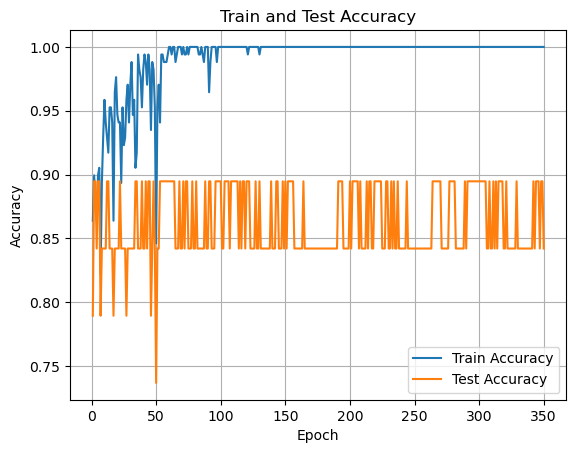

In [184]:
def main():
    parser = argparse.ArgumentParser(description='PyTorch graph convolutional neural net for whole-graph classification')
    parser.add_argument('--dataset', type=str, default="MUTAG")
    parser.add_argument('--device', type=int, default=0)
    parser.add_argument('--batch_size', type=int, default=32)
    parser.add_argument('--iters_per_epoch', type=int, default=50)
    parser.add_argument('--epochs', type=int, default=350)
    parser.add_argument('--lr', type=float, default=0.01)
    parser.add_argument('--seed', type=int, default=0)
    parser.add_argument('--fold_idx', type=int, default=0)
    parser.add_argument('--num_layers', type=int, default=5)
    parser.add_argument('--num_mlp_layers', type=int, default=2)
    parser.add_argument('--hidden_dim', type=int, default=64)
    parser.add_argument('--final_dropout', type=float, default=0.5)
    parser.add_argument('--graph_pooling_type', type=str, default="sum", choices=["sum", "average"])
    parser.add_argument('--neighbor_pooling_type', type=str, default="sum", choices=["sum", "average", "max"])
    parser.add_argument('--learn_eps', action="store_true")
    parser.add_argument('--degree_as_tag', action="store_true")
    parser.add_argument('--filename', type = str, default = "")    

    args, unknown = parser.parse_known_args()

    #set up seeds and gpu device
    torch.manual_seed(0)
    np.random.seed(0)    
    device = torch.device("cuda:" + str(args.device)) if torch.cuda.is_available() else torch.device("cpu")
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(0)

    graphs, num_classes = load_data(args.dataset, args.degree_as_tag)    

    ##10-fold cross validation. Conduct an experiment on the fold specified by args.fold_idx.
    train_graphs, test_graphs = separate_data(graphs, args.seed, args.fold_idx)

    model = GIN(args.num_layers, args.num_mlp_layers, train_graphs[0].node_features.shape[1], args.hidden_dim, num_classes, args.final_dropout, args.learn_eps, args.graph_pooling_type, args.neighbor_pooling_type, device).to(device)

    optimizer = optim.Adam(model.parameters(), lr=args.lr)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.5)

    index=0
    train_acc_values = []
    test_acc_values = []
    for epoch in range(1, args.epochs + 1):
        avg_loss = train(args, model, device, train_graphs, optimizer, epoch)
        acc_train, acc_test = test(args, model, device, train_graphs, test_graphs, epoch)
        scheduler.step()
        train_acc_values.append(acc_train)
        test_acc_values.append(acc_test)
        
        #print(f"epoch:{index:03}      loss training:{avg_loss}     train accuracy:{acc_train}     test accuracy:{acc_test}")
        
        print(f'Epoch: {index:03d},  Loss training: {avg_loss:.15f},  Train accuracy: {acc_train:.15f},  Test accuracy: {acc_test:.15f}')
        index=index+1

        if not args.filename == "":
            with open(args.filename, 'w') as f:
                f.write("%f %f %f" % (avg_loss, acc_train, acc_test))
                f.write("\n")
        #print("")
        #print(model.eps)
    
    plt.plot(range(1, args.epochs + 1), train_acc_values, label='Train Accuracy')
    plt.plot(range(1, args.epochs + 1), test_acc_values, label='Test Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Train and Test Accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()

if __name__ == '__main__':
    main()

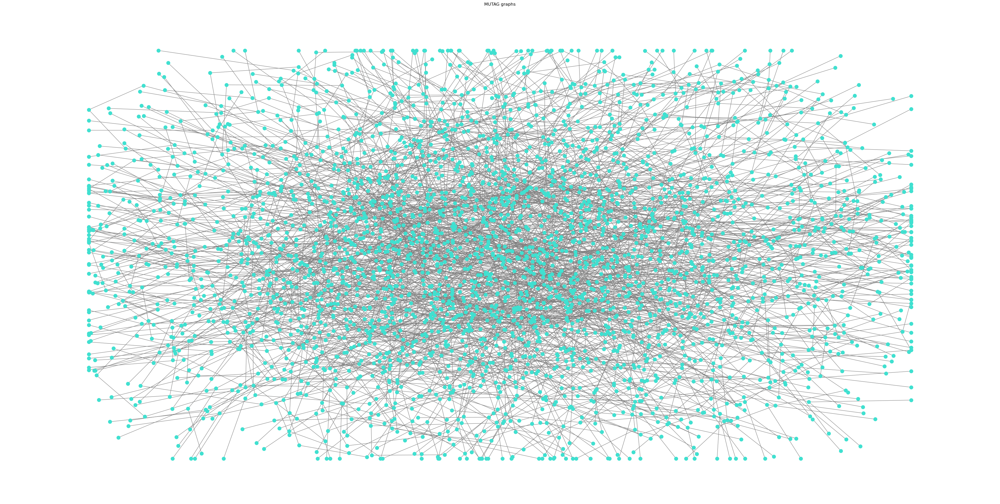

In [45]:
plot_all_dataset("MUTAG")

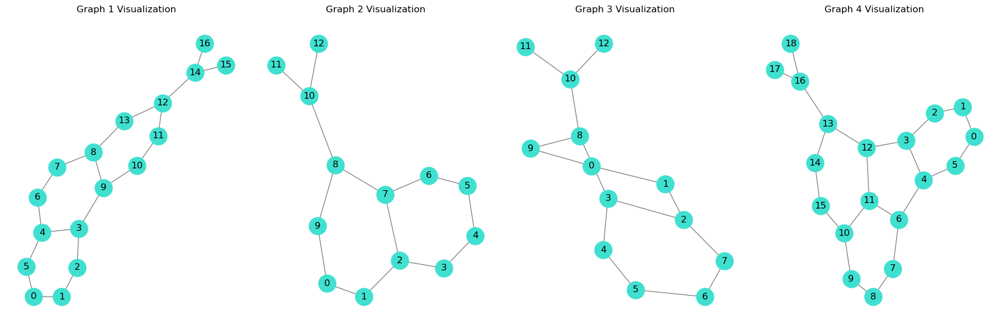

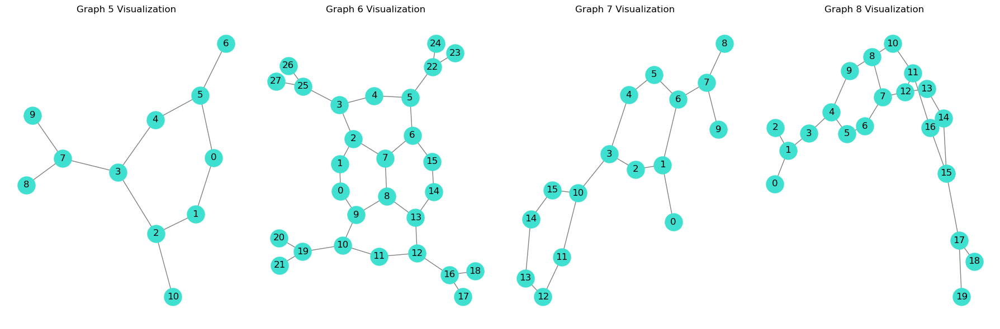

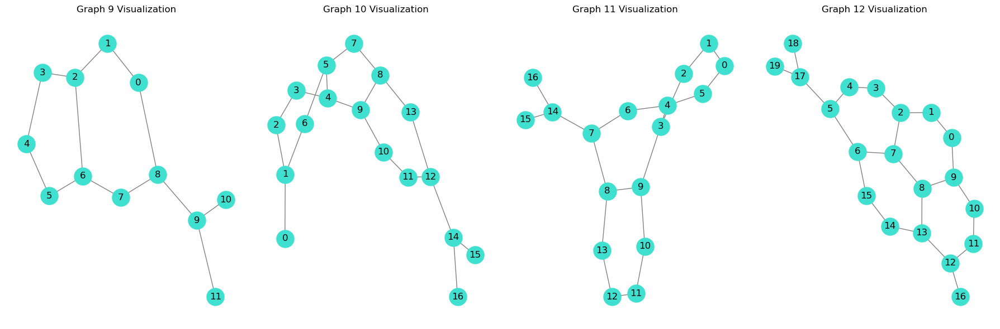

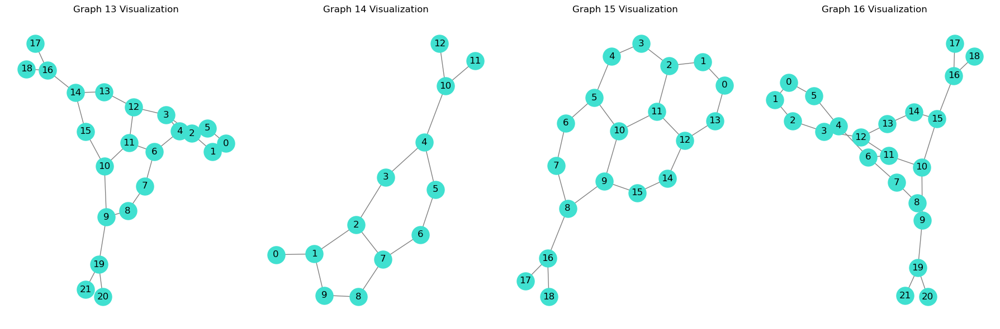

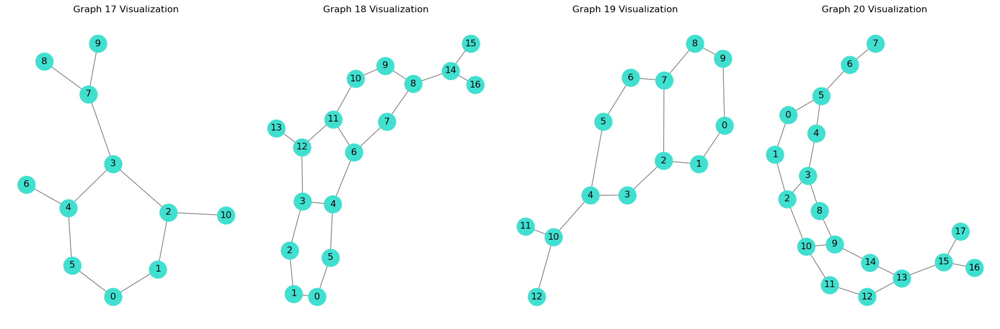

In [10]:
plot_dataset("MUTAG")

&emsp;Următorul dataset este **NCI1**, care face parte tot din bioinformatics dataset.

Date despre acest dataset:
# numărul de clase: 2
# număr de grafuri: 4110
Epoch: 000,  Loss training: 8.078700451850890,  Train accuracy: 0.614490402811571,  Test accuracy: 0.600973236009732
Epoch: 001,  Loss training: 4.544888625144958,  Train accuracy: 0.587185725871857,  Test accuracy: 0.600973236009732
Epoch: 002,  Loss training: 3.223948017358780,  Train accuracy: 0.684779670181130,  Test accuracy: 0.703163017031630
Epoch: 003,  Loss training: 2.271574431657791,  Train accuracy: 0.650986753176534,  Test accuracy: 0.693430656934307
Epoch: 004,  Loss training: 1.672327750921249,  Train accuracy: 0.570694782373614,  Test accuracy: 0.588807785888078
Epoch: 005,  Loss training: 1.570441574454308,  Train accuracy: 0.575020275750203,  Test accuracy: 0.574209245742092
Epoch: 006,  Loss training: 1.947098278403282,  Train accuracy: 0.682887266828873,  Test accuracy: 0.690997566909976
Epoch: 007,  Loss training: 1.385169704556465,  Train accuracy: 0.692889970262233,  Test accuracy: 0.712895

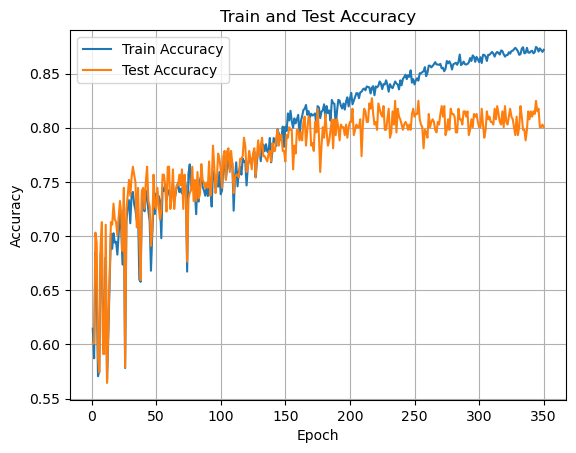

In [185]:
def main():
    parser = argparse.ArgumentParser(description='PyTorch graph convolutional neural net for whole-graph classification')
    parser.add_argument('--dataset', type=str, default="NCI1")
    parser.add_argument('--device', type=int, default=0)
    parser.add_argument('--batch_size', type=int, default=32)
    parser.add_argument('--iters_per_epoch', type=int, default=50)
    parser.add_argument('--epochs', type=int, default=350)
    parser.add_argument('--lr', type=float, default=0.01)
    parser.add_argument('--seed', type=int, default=0)
    parser.add_argument('--fold_idx', type=int, default=0)
    parser.add_argument('--num_layers', type=int, default=5)
    parser.add_argument('--num_mlp_layers', type=int, default=2)
    parser.add_argument('--hidden_dim', type=int, default=64)
    parser.add_argument('--final_dropout', type=float, default=0.5)
    parser.add_argument('--graph_pooling_type', type=str, default="sum", choices=["sum", "average"])
    parser.add_argument('--neighbor_pooling_type', type=str, default="sum", choices=["sum", "average", "max"])
    parser.add_argument('--learn_eps', action="store_true")
    parser.add_argument('--degree_as_tag', action="store_true")
    parser.add_argument('--filename', type = str, default = "")    

    args, unknown = parser.parse_known_args()
    torch.manual_seed(0)
    np.random.seed(0)    
    device = torch.device("cuda:" + str(args.device)) if torch.cuda.is_available() else torch.device("cpu")
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(0)

    graphs, num_classes = load_data(args.dataset, args.degree_as_tag)    
    train_graphs, test_graphs = separate_data(graphs, args.seed, args.fold_idx)
    model = GIN(args.num_layers, args.num_mlp_layers, train_graphs[0].node_features.shape[1], args.hidden_dim, num_classes, args.final_dropout, args.learn_eps, args.graph_pooling_type, args.neighbor_pooling_type, device).to(device)

    optimizer = optim.Adam(model.parameters(), lr=args.lr)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.5)

    index=0
    train_acc_values = []
    test_acc_values = []
    for epoch in range(1, args.epochs + 1):
        avg_loss = train(args, model, device, train_graphs, optimizer, epoch)
        acc_train, acc_test = test(args, model, device, train_graphs, test_graphs, epoch)
        scheduler.step()
        train_acc_values.append(acc_train)
        test_acc_values.append(acc_test)
        
        print(f'Epoch: {index:03d},  Loss training: {avg_loss:.15f},  Train accuracy: {acc_train:.15f},  Test accuracy: {acc_test:.15f}')
        index=index+1
        if not args.filename == "":
            with open(args.filename, 'w') as f:
                f.write("%f %f %f" % (avg_loss, acc_train, acc_test))
                f.write("\n")
    
    plt.plot(range(1, args.epochs + 1), train_acc_values, label='Train Accuracy')
    plt.plot(range(1, args.epochs + 1), test_acc_values, label='Test Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Train and Test Accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()

if __name__ == '__main__':
    main()

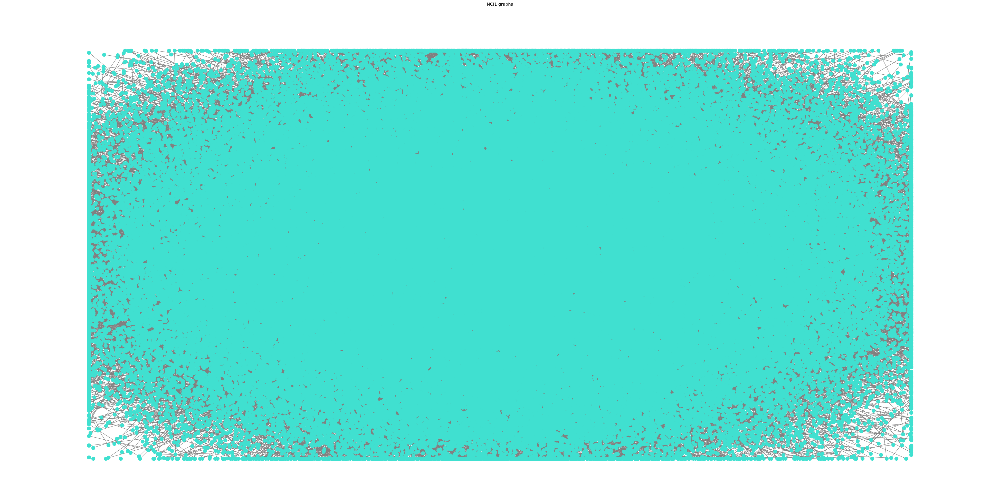

In [46]:
plot_all_dataset("NCI1")

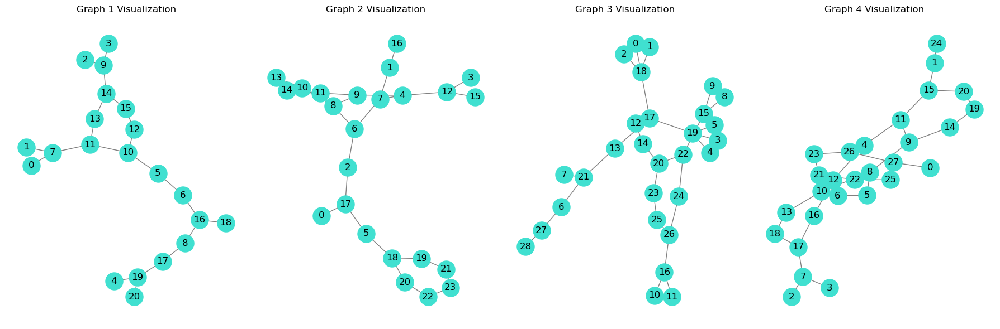

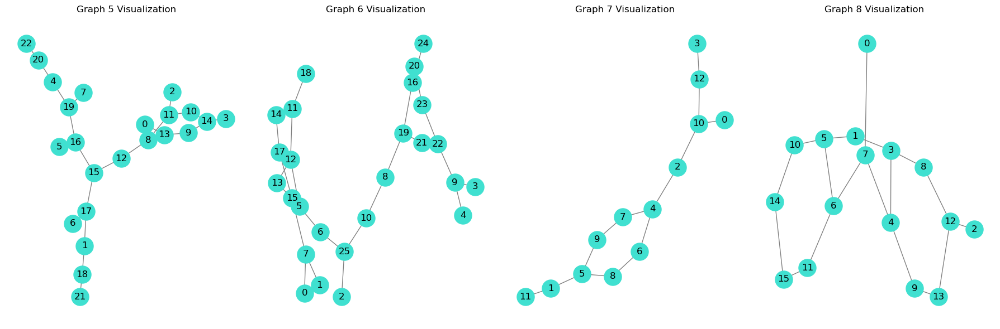

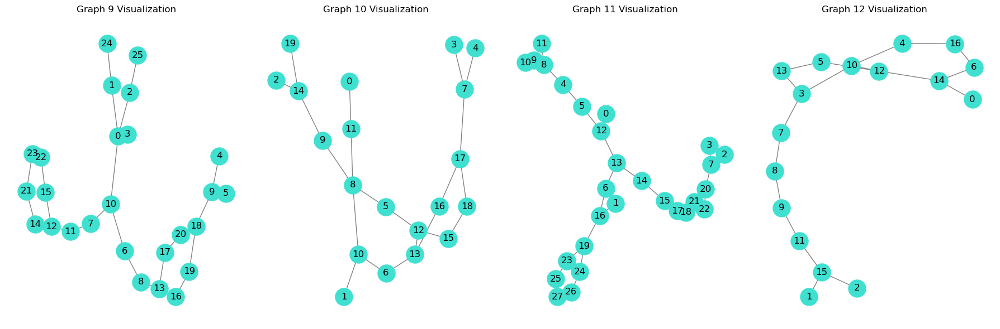

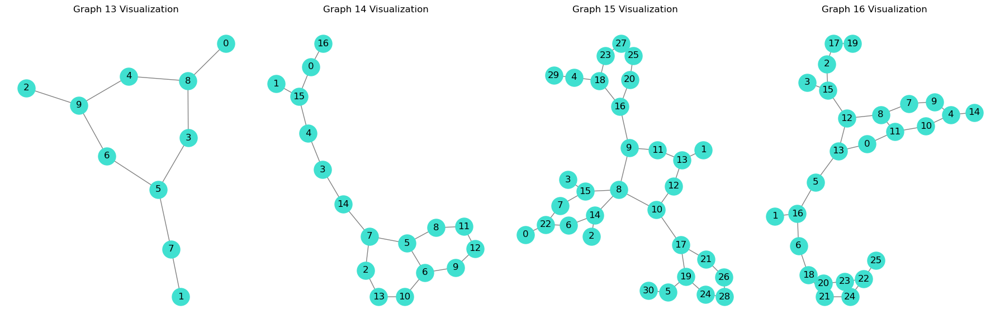

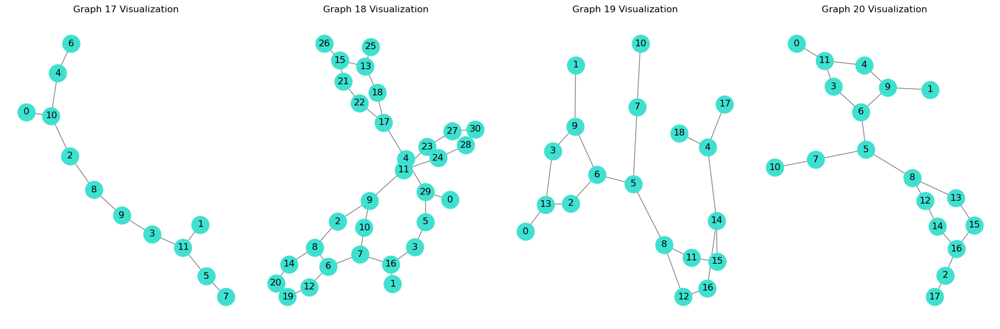

In [12]:
plot_dataset("NCI1")

&emsp;Așa arată întregul dataset **PROTEINS**, dataset care face parte din bioinformatics dataset.

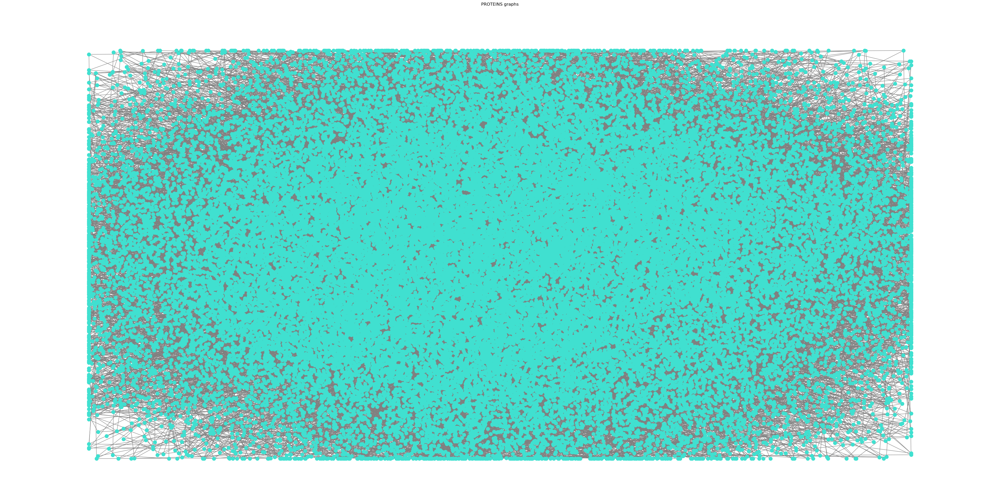

In [47]:
plot_all_dataset("PROTEINS")

&emsp;Primele 20 de grafuri din datasetul **PROTEINS**.

Processing...
Done!


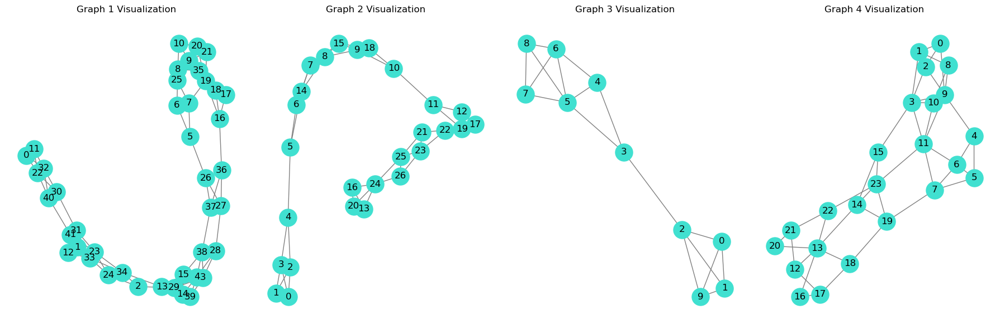

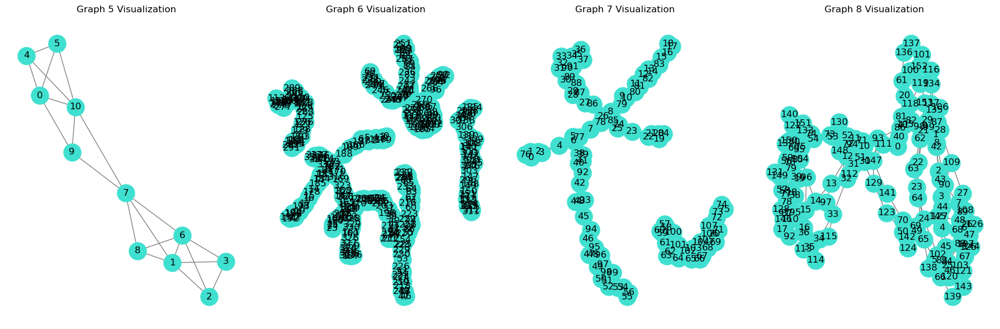

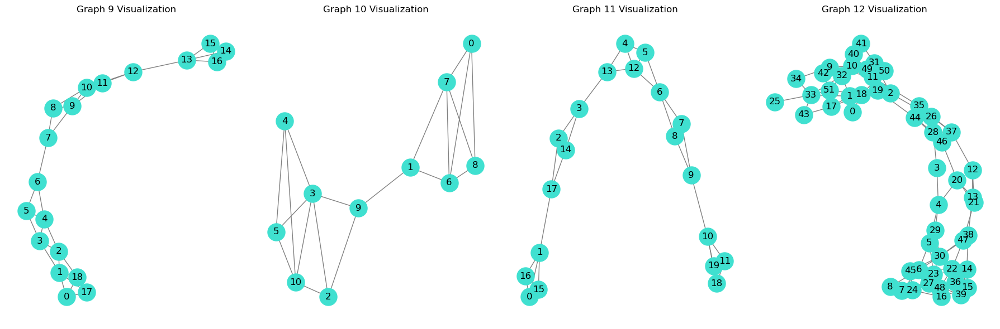

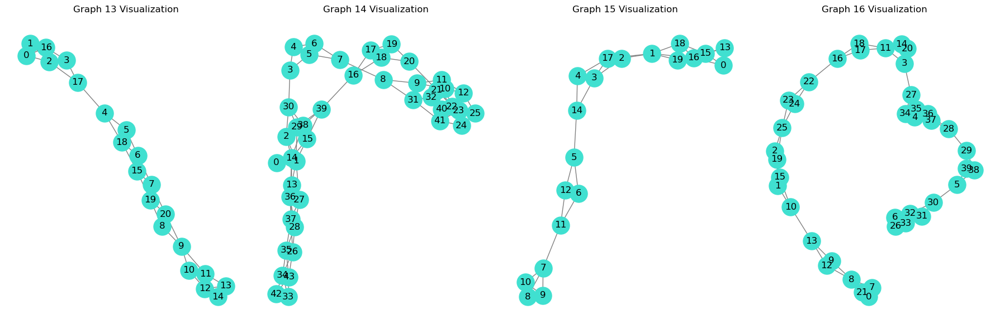

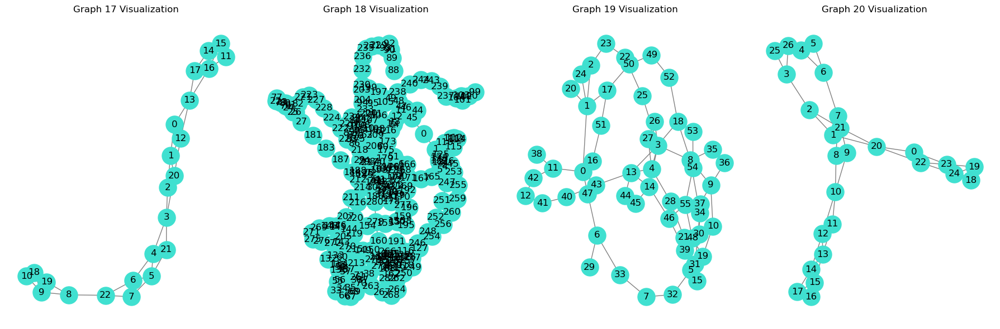

In [13]:
plot_dataset("PROTEINS")

&emsp;Datorită faptului că datasetul **COLLAB** face parte din social network dataset, și conține 5000 de grafuri, nu am desenat și întregul dataset, ci doar primele 20 de grafuri din el. Se obbservă diferența între grafurile din cealaltă categorie, cele bioinformatice au mai multe noduri și puține legături, pe când cele sociale au fix invers, adică au foarte multe legături și puține noduri.

Processing...
Done!


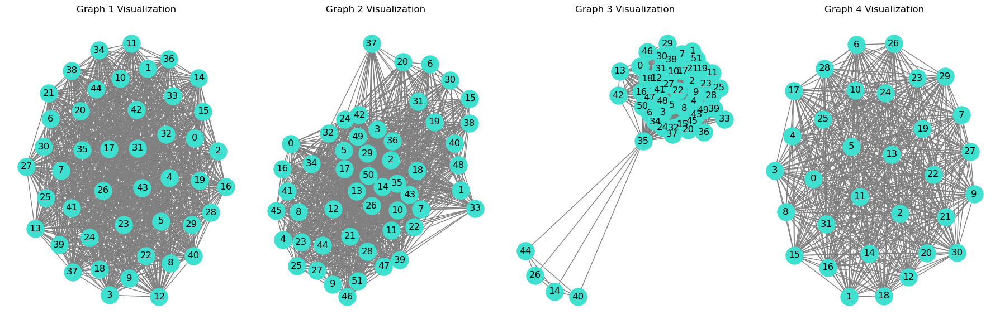

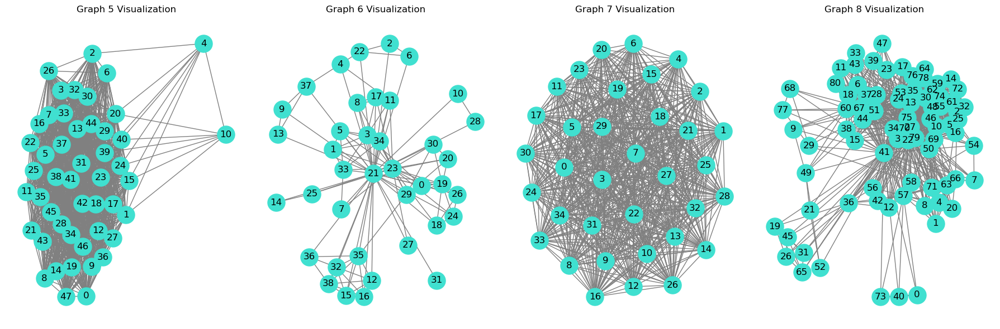

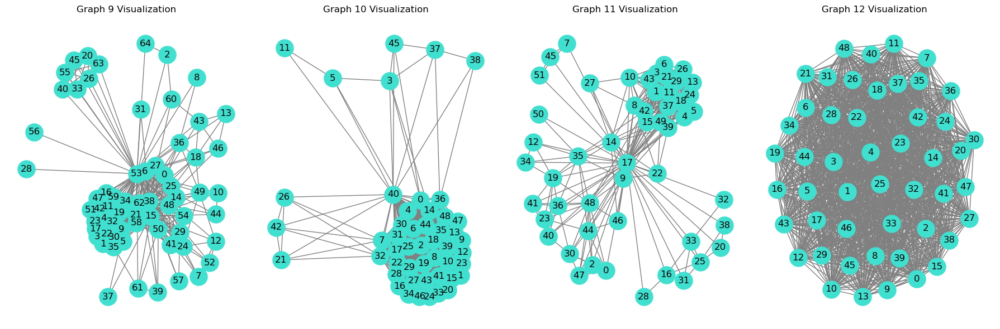

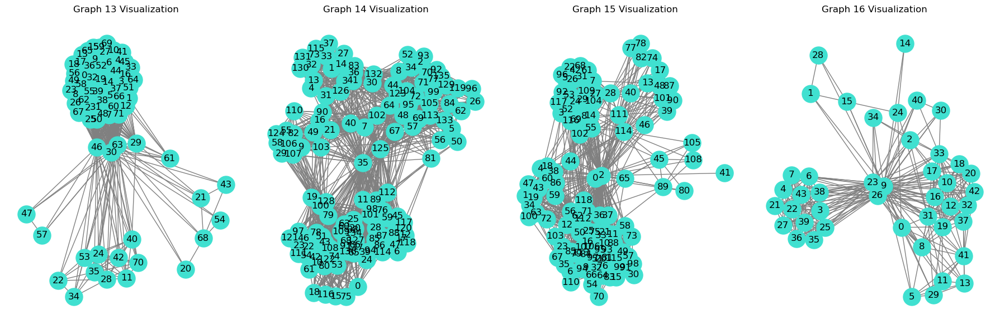

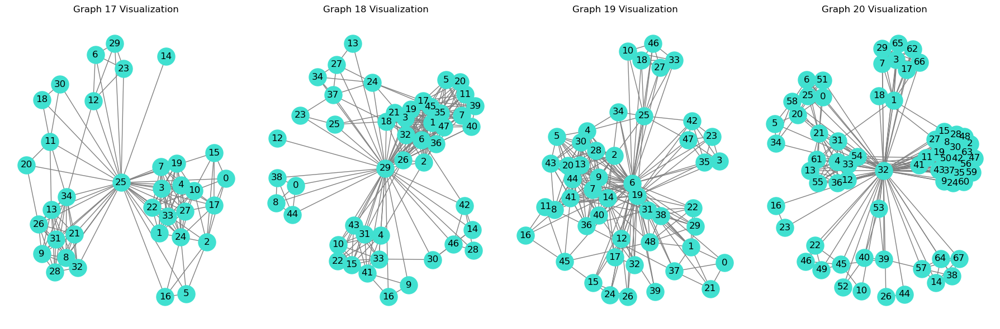

In [14]:
plot_dataset("COLLAB")

Am să îmi creez propriul GIN

In [1]:
import torch
from torch import nn
import torch.nn.functional as F
from torch_geometric.datasets import TUDataset
from torch_geometric.loader import DataLoader
from torch_geometric.nn import GINConv, global_add_pool
import matplotlib.pyplot as plt

torch.manual_seed(42)
torch.backends.cudnn.deterministic = True

#datasetul conține 188 de grafuri
dataset = TUDataset(root='/tmp/MUTAG', name='MUTAG').shuffle()          # încărcarea setului de date MUTAG din torch_geometric.datasets

#din cele 188 de grafuri, am folosit 150 in setul de train (aprox 80%), iar restul de 38 în setul de test 
train_dataset = dataset[:150]                                           # împărțirea setului de date în seturi de antrenament și testare
test_dataset = dataset[150:]

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)   #se iterează peste setul de train
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)    #se iterează peste setul de test


In [2]:
from torch.nn import Sequential, Linear, ReLU, Dropout

class MGIN(torch.nn.Module):
    def __init__(self, num_features, hidden_dim, num_classes):
        super(MGIN, self).__init__()
        #nn1, nn2, nn3 reprezinta MLP-urile ce apar în cadrul  construcției GIN-ului
        #nn1- este diferit față de restul deoarece ia la intrare numărul de features vectori ai întregii rețea
        nn1 = Sequential(Linear(num_features, hidden_dim), ReLU(), Linear(hidden_dim, hidden_dim)) 
        nn2 = Sequential(Linear(hidden_dim, hidden_dim), ReLU(), Linear(hidden_dim, hidden_dim))
        nn3 = Sequential(Linear(hidden_dim, hidden_dim), ReLU(), Linear(hidden_dim, hidden_dim))
        nn4 = Sequential(Linear(hidden_dim, hidden_dim), ReLU(), Linear(hidden_dim, hidden_dim))
        nn5 = Sequential(Linear(hidden_dim, hidden_dim), ReLU(), Linear(hidden_dim, hidden_dim))

        #GINConv este un tip de layer de convoluție pentru grafuri care este conceput pentru a fi puternic din punct de vedere expresiv
        #similar cu testul Weisfeiler-Lehman pentru isomorfismul grafurilor
        #fiecare MLP este introdus într-un layer GINConv
        self.conv1 = GINConv(nn1)
        self.conv2 = GINConv(nn2)
        self.conv3 = GINConv(nn3)
        self.conv4 = GINConv(nn4)
        self.conv5 = GINConv(nn5)

        #aceste layers vin după fiecare GINConv pentru a concatena la final score-urile
        #ultimul Linear layer ce este aplicat trebuie să aibă ca dimensiune număr de clase, deoarece se face o clasificare 
        self.lin1 = Linear(hidden_dim, hidden_dim)
        self.lin2 = Linear(hidden_dim, num_classes)

        self.dropout= Dropout(0.5)

    #edge_index este o variabilă care conține muchiile din dataset
    #are dimensiunea de (2, nr_muchii), pe primul rând avem nodul sursă, iar pe al doilea nodul destinație
    #el este generat automat prin apelarea lui; data.edge_index
    #fiecare element din batch este un indice care indică cărui graf aparține un nod
    def forward(self, x, edge_index, batch):
        x = F.relu(self.conv1(x, edge_index))
        a=self.lin1(x)
        a=self.dropout(a)
        suma= global_add_pool(a, batch)
        
        x = F.relu(self.conv2(x, edge_index))
        a=self.lin1(x)
        a=self.dropout(a)
        suma= global_add_pool(a, batch)
        
        x = F.relu(self.conv3(x, edge_index))
        a=self.lin1(x)
        a=self.dropout(a)
        suma= global_add_pool(a, batch)

        x = F.relu(self.conv4(x, edge_index))
        a=self.lin1(x)
        a=self.dropout(a)
        suma= global_add_pool(a, batch)
        
        x = F.relu(self.conv5(x, edge_index))
        a=self.lin1(x)
        a=self.dropout(a)
        suma= global_add_pool(a, batch)

        #x = global_add_pool(x, batch)  # Suma nodurilor
        #x = F.relu(self.lin1(suma))
        x = self.lin2(suma)

        return F.log_softmax(x, dim=-1)


In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = MGIN(num_features=dataset.num_features, hidden_dim=64, num_classes=dataset.num_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)

def train():
    model.train()
    total_loss = 0
    for data in train_loader:                                #iterează prin setul de train 
        data = data.to(device)
        optimizer.zero_grad()                                #resetează gradienții
        out = model(data.x, data.edge_index, data.batch)     #rezultatele ce se obțin în urma antrenării
        loss = F.nll_loss(out, data.y)                       #face o analiză a rezultatelor obținute si a celor reale și calculează loss-ul
        loss.backward()                                      #face un pas înapoi
        optimizer.step()                                     #actualizează param modelului pe baza gradienților calculați
        total_loss += loss.item() * data.num_graphs          #se actualizează loss-ul
    avg_loss = total_loss / len(train_loader.dataset)
    train_losses.append(avg_loss)                            #se lipește la  lista de loss-uri
    return avg_loss

def test(loader):
    model.eval()                        #pune modelul în modul de antrenare (se elimină elem specifice de antrenare: batch_norm si dropout)
    correct = 0                         #contor pt predicții corecte
    for data in loader:                 #se iterează peste setul de test
        data = data.to(device)
        out = model(data.x, data.edge_index, data.batch)
        pred = out.argmax(dim=1)        #returnează clasa cu cea mai mare probabilitate
        correct += (pred == data.y).sum().item()  #se compară cu ce ar fi trebuit să obținem și se adună predicția corectă
    return correct / len(loader.dataset)


Epoch: 001, Loss: 1.7621, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 002, Loss: 0.6772, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 003, Loss: 0.5656, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 004, Loss: 0.5553, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 005, Loss: 0.5382, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 006, Loss: 0.5538, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 007, Loss: 0.5917, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 008, Loss: 0.5523, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 009, Loss: 0.5693, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 010, Loss: 0.5469, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 011, Loss: 0.5433, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 012, Loss: 0.5402, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 013, Loss: 0.5429, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 014, Loss: 0.5444, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 015, Loss: 0.5359, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 016, Loss: 0.5729, Train Acc: 0.6933, Test Acc: 0.5526
Epoch: 0

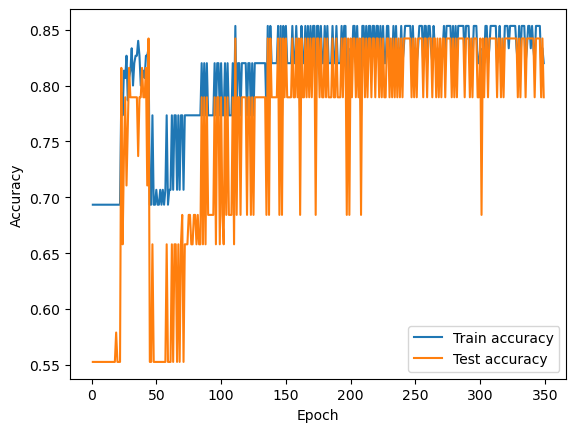

In [4]:
train_losses=[]                                   #listă care conține toate loss-urile de la fiecare epocă
train_acc_list = []                               #listă care va conține rezultatul în urma antrenării, folosit la plot
test_acc_list = []                                #listă care va conține rezultatul în urma testului, folosit la plot
for epoch in range(1, 350):                       #parcurgerea peste cele 350 de epoci
    loss = train()                                #se aplică funcția de train
    train_acc = test(train_loader)
    test_acc = test(test_loader)                  #se aplică funcția de test
    train_acc_list.append(train_acc)              #se lipește la listă pt a salva data pentru plot
    test_acc_list.append(test_acc)
    print(f'Epoch: {epoch:03d}, Loss: {loss:.4f}, Train Acc: {train_acc:.4f}, Test Acc: {test_acc:.4f}')

plt.plot(range(1, 350), train_acc_list, label='Train accuracy')
plt.plot(range(1, 350), test_acc_list, label='Test accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()